In [12]:
from tensorflow.keras.models import load_model

In [13]:
from keras.callbacks import Callback,ModelCheckpoint
from keras.models import Sequential,load_model
from keras.layers import Dense, Dropout
import keras.backend as K
def get_f1(y_true, y_pred): #taken from old keras source code
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

In [28]:
class_labels = [
    "2-1-1", "2-1-2", "2-1-3", "2-2-1", "2-2-2", "2-2-3", "2-3-3",
    "3-1-1", "3-1-2", "3-1-3", "3-2-1", "3-2-2", "3-2-3", "3-3-2",
    "3-3-3", "4-2-2", "Arrested", "Early", "Morula"
]

In [33]:
img_dir = '/content/example_image'

#InceptionV3

In [20]:
# Load a model saved in a .h5 file
custom_objects = {'get_f1': get_f1}

# Load the model with the custom objects
model = load_model('/content/drive/MyDrive/Project/Weight/InceptionV3_Optimizer_Rmsprop_26epoch/InceptionV3_Optimizer_RMSprop_26epoch.h5', custom_objects=custom_objects)

# Display the model architecture
# model.summary()

In [31]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input, decode_predictions
import numpy as np
import matplotlib.pyplot as plt
import os

In [32]:
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    return img_array

1/1 [==============================] - 0s 152ms/step
Result for 323.jpg is 3-2-3


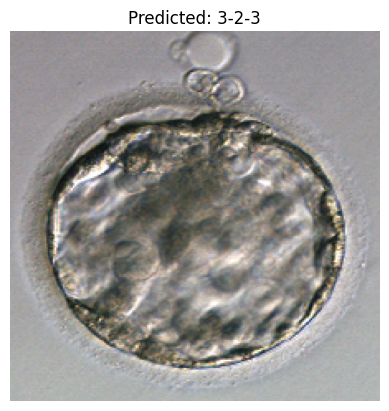

1/1 [==============================] - 0s 135ms/step
Result for 221.jpg is 2-2-1


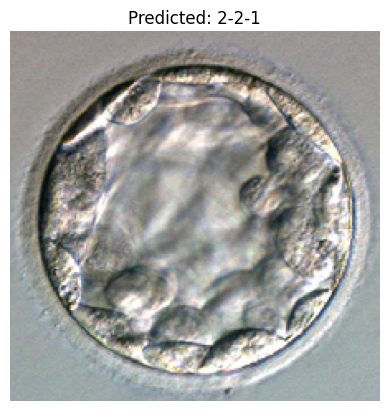

1/1 [==============================] - 0s 170ms/step
Result for 333.jpg is 3-3-3


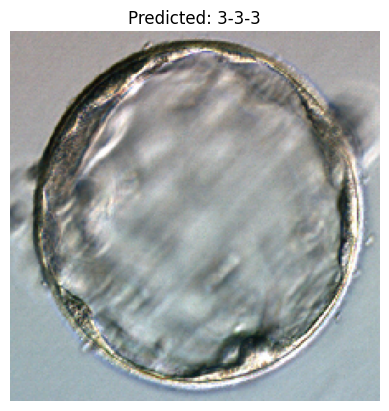

1/1 [==============================] - 0s 128ms/step
Result for 212.jpg is 2-2-2


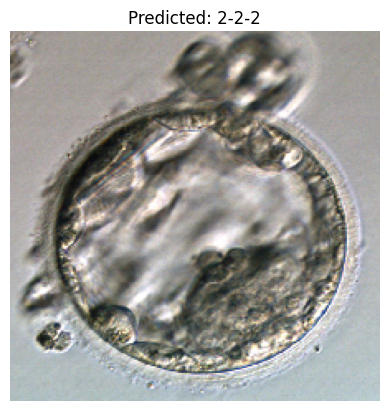

1/1 [==============================] - 0s 143ms/step
Result for 222.jpg is 2-2-3


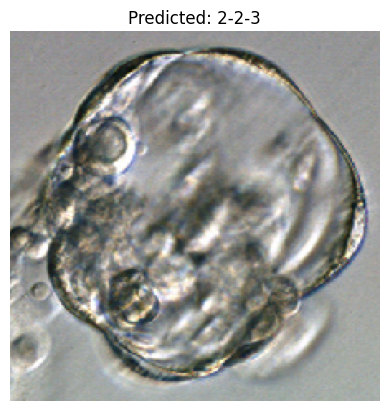

1/1 [==============================] - 0s 129ms/step
Result for Morula.jpg is Early


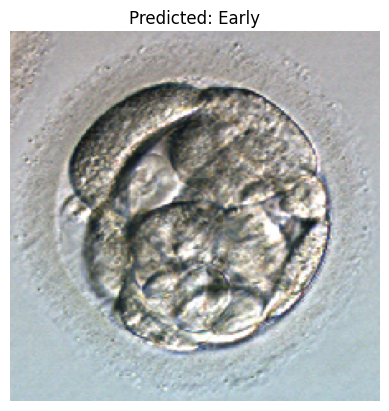

1/1 [==============================] - 0s 159ms/step
Result for 313.jpg is 3-1-3


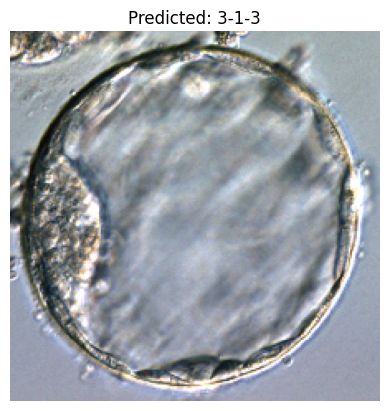

1/1 [==============================] - 0s 128ms/step
Result for 211.jpg is 2-1-1


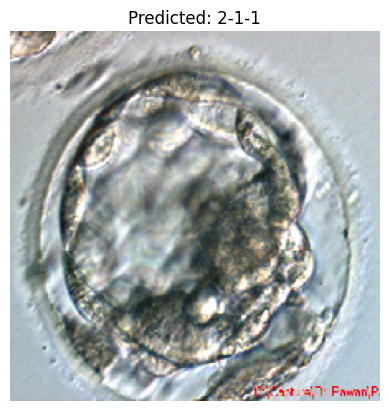

1/1 [==============================] - 0s 135ms/step
Result for 311.jpg is 3-1-1


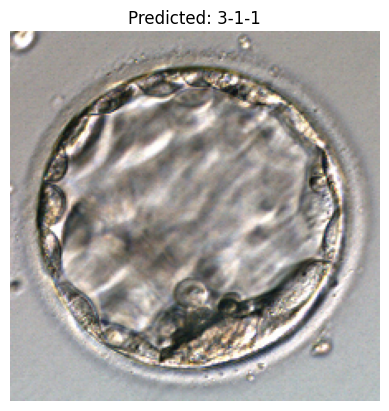

1/1 [==============================] - 0s 149ms/step
Result for 233.jpg is 3-3-3


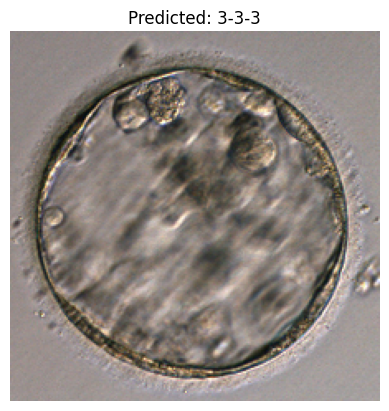

1/1 [==============================] - 0s 152ms/step
Result for 332.jpg is 3-3-2


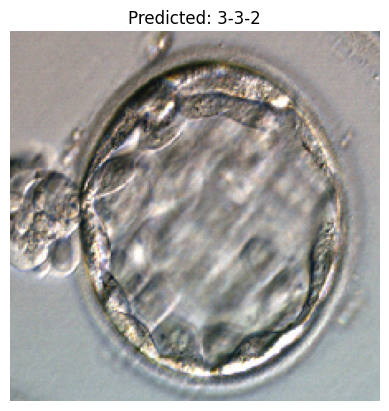

1/1 [==============================] - 0s 204ms/step
Result for 223.jpg is 2-2-3


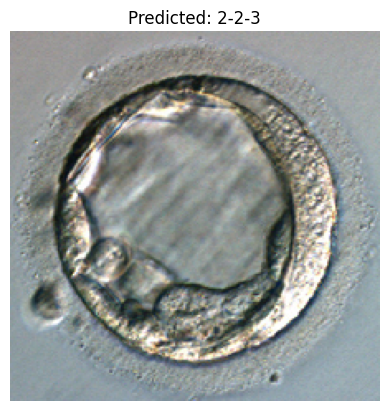

1/1 [==============================] - 0s 141ms/step
Result for 322.jpg is 2-1-2


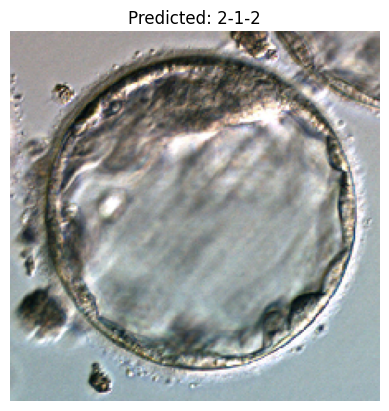

1/1 [==============================] - 0s 146ms/step
Result for 213.jpg is 2-2-3


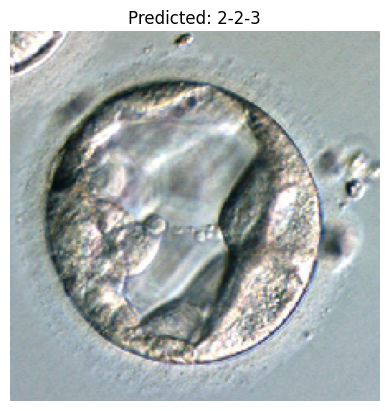

1/1 [==============================] - 0s 142ms/step
Result for 422.jpg is 4-2-2


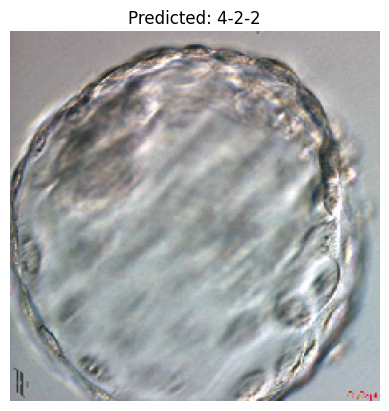

1/1 [==============================] - 0s 143ms/step
Result for Early.jpg is Early


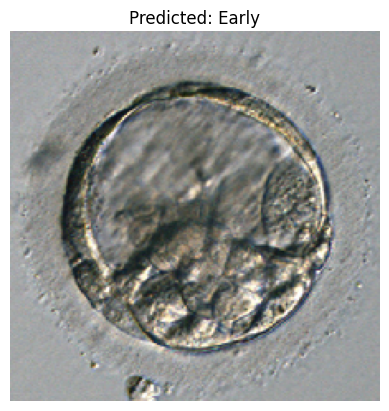

1/1 [==============================] - 0s 173ms/step
Result for 312.jpg is 2-2-3


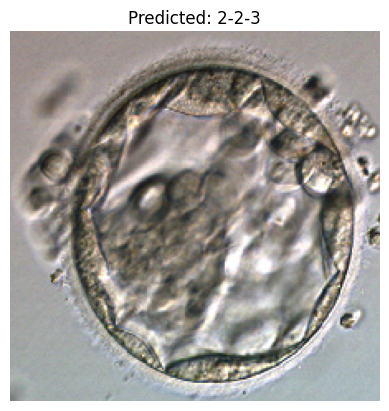

1/1 [==============================] - 0s 269ms/step
Result for Arrested.jpg is Arrested


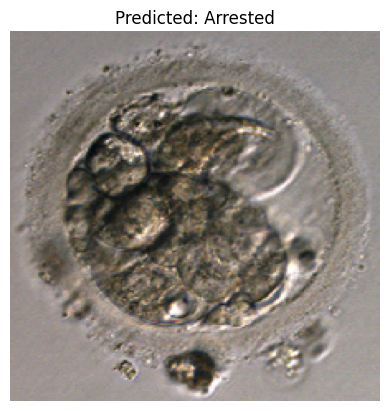

1/1 [==============================] - 0s 266ms/step
Result for 321.jpg is 3-2-1


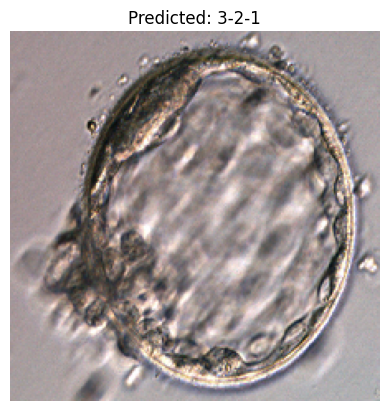

In [34]:
for filename in os.listdir(img_dir):
    img_path = os.path.join(img_dir, filename)
    if os.path.isfile(img_path) and filename.lower().endswith(('png', 'jpg', 'jpeg')):
        # Preprocess the image
        img_array = preprocess_image(img_path)

        # Make predictions
        predictions = model.predict(img_array)

        # Get the predicted class index
        predicted_class_indices = np.argmax(predictions, axis=1)

        # Map the predicted class indices to class labels
        predicted_labels = [class_labels[idx] for idx in predicted_class_indices]

        # Print the predictions
        for label in predicted_labels:
            print(f"Result for {filename} is {label}")

        # Optionally, display the image
        plt.imshow(image.array_to_img(img_array[0]))
        plt.axis('off')
        plt.title(f"Predicted: {predicted_labels[0]}")
        plt.show()

#Xception

In [35]:
# Load a model saved in a .h5 file
custom_objects = {'get_f1': get_f1}

# Load the model with the custom objects
model = load_model('/content/drive/MyDrive/Project/Weight/Xception_Optimizer_Rmsprop_26epoch/Xception_Optimizer_RMSprop_26epoch.h5', custom_objects=custom_objects)

# Display the model architecture
# model.summary()

In [36]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.xception import Xception, preprocess_input, decode_predictions
import numpy as np
import matplotlib.pyplot as plt
import os

In [37]:
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    return img_array

1/1 [==============================] - 1s 1s/step
Result for 323.jpg is 3-2-3


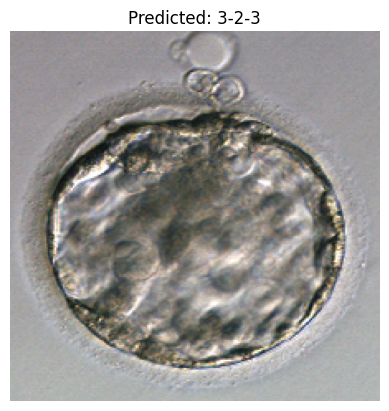

1/1 [==============================] - 0s 202ms/step
Result for 221.jpg is 2-2-1


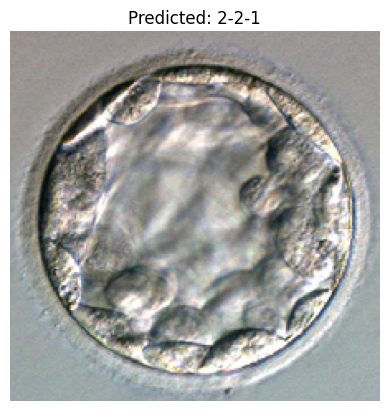

1/1 [==============================] - 0s 190ms/step
Result for 333.jpg is 3-3-3


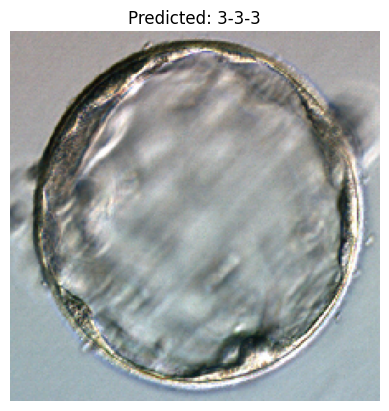

1/1 [==============================] - 0s 218ms/step
Result for 212.jpg is 2-2-3


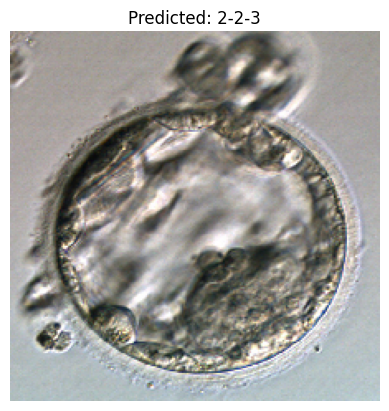

1/1 [==============================] - 0s 207ms/step
Result for 222.jpg is 3-1-2


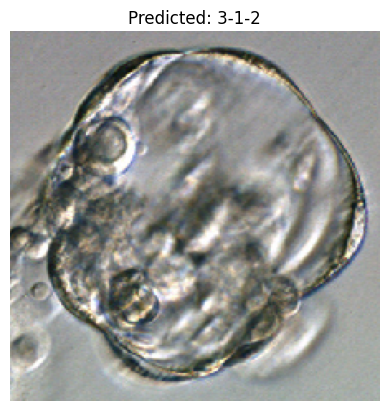

1/1 [==============================] - 0s 250ms/step
Result for Morula.jpg is Early


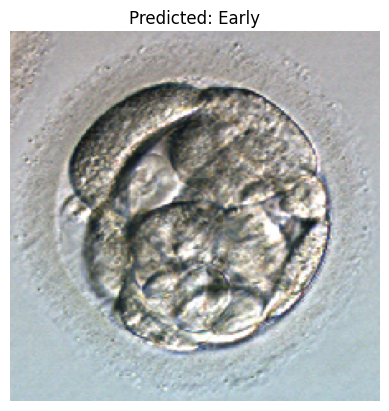

1/1 [==============================] - 0s 202ms/step
Result for 313.jpg is 3-1-3


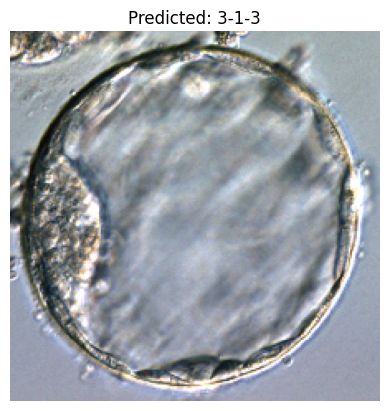

1/1 [==============================] - 0s 277ms/step
Result for 211.jpg is Early


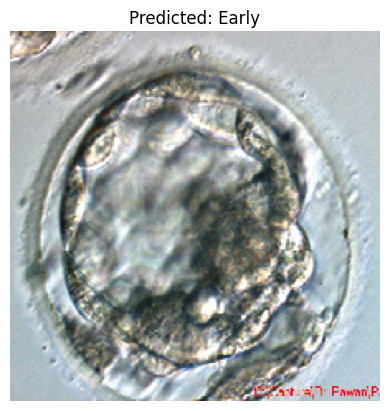

1/1 [==============================] - 0s 337ms/step
Result for 311.jpg is 3-1-1


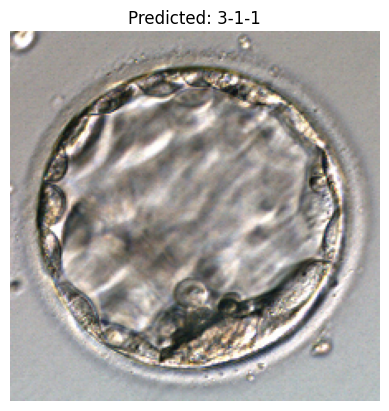

1/1 [==============================] - 0s 371ms/step
Result for 233.jpg is 2-2-3


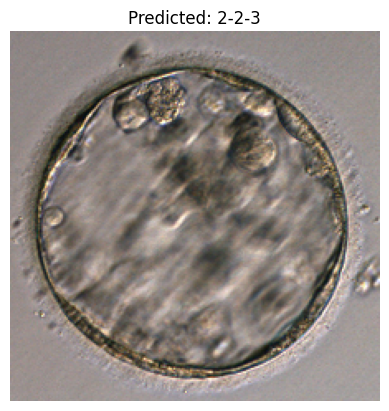

1/1 [==============================] - 1s 544ms/step
Result for 332.jpg is 3-1-1


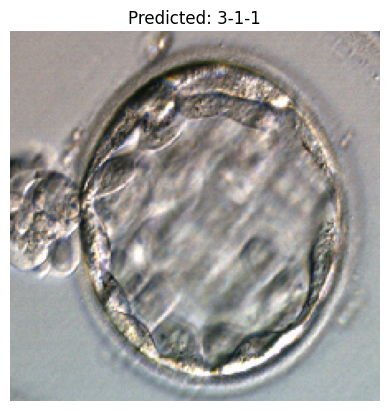

1/1 [==============================] - 0s 298ms/step
Result for 223.jpg is 2-2-3


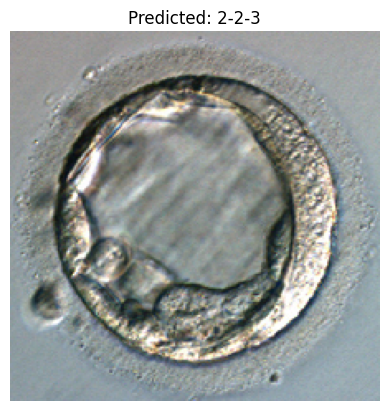

1/1 [==============================] - 0s 203ms/step
Result for 322.jpg is 3-3-3


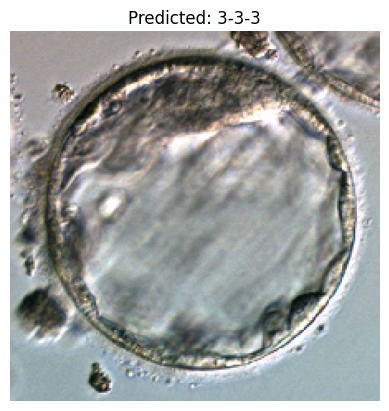

1/1 [==============================] - 0s 269ms/step
Result for 213.jpg is 2-1-3


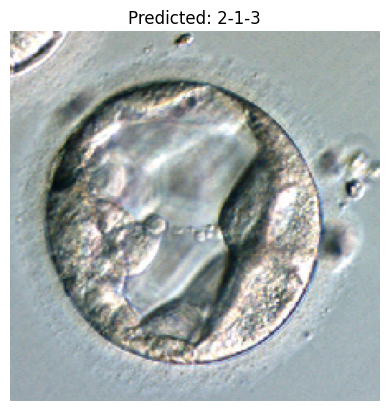

1/1 [==============================] - 0s 202ms/step
Result for 422.jpg is 4-2-2


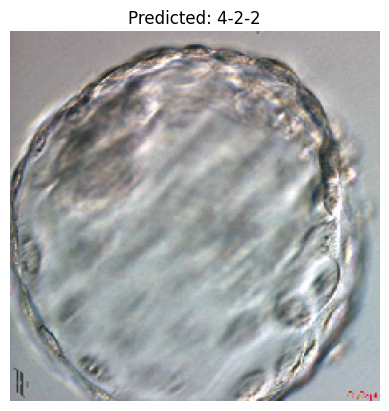

1/1 [==============================] - 0s 229ms/step
Result for Early.jpg is Early


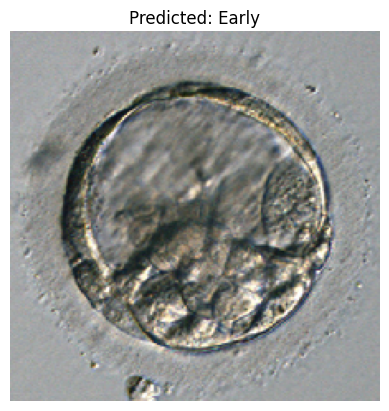

1/1 [==============================] - 0s 230ms/step
Result for 312.jpg is 2-2-2


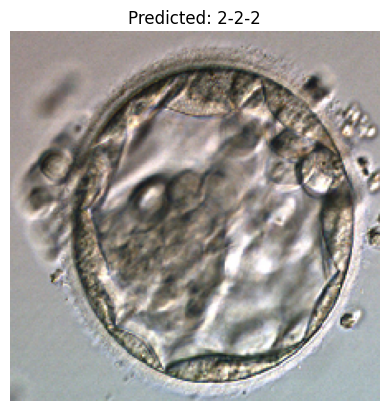

1/1 [==============================] - 0s 218ms/step
Result for Arrested.jpg is Arrested


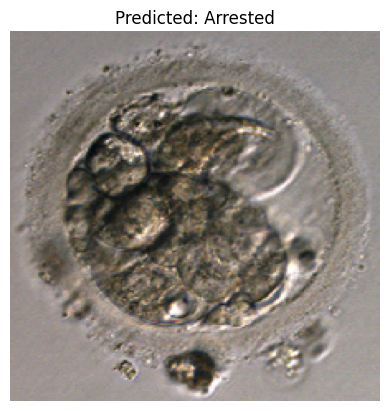

1/1 [==============================] - 0s 232ms/step
Result for 321.jpg is 3-2-1


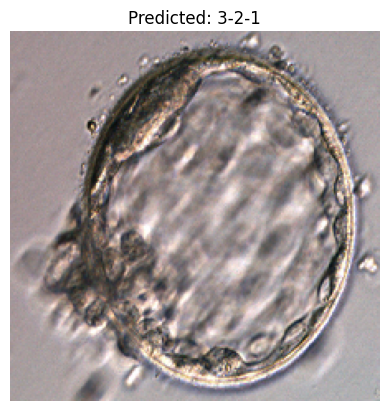

In [38]:
for filename in os.listdir(img_dir):
    img_path = os.path.join(img_dir, filename)
    if os.path.isfile(img_path) and filename.lower().endswith(('png', 'jpg', 'jpeg')):
        # Preprocess the image
        img_array = preprocess_image(img_path)

        # Make predictions
        predictions = model.predict(img_array)

        # Get the predicted class index
        predicted_class_indices = np.argmax(predictions, axis=1)

        # Map the predicted class indices to class labels
        predicted_labels = [class_labels[idx] for idx in predicted_class_indices]

        # Print the predictions
        for label in predicted_labels:
            print(f"Result for {filename} is {label}")

        # Optionally, display the image
        plt.imshow(image.array_to_img(img_array[0]))
        plt.axis('off')
        plt.title(f"Predicted: {predicted_labels[0]}")
        plt.show()